In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import torch.optim.lr_scheduler as lr_scheduler
from torch.optim.lr_scheduler import LinearLR, CosineAnnealingLR, SequentialLR, OneCycleLR
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms, models
from torchvision.datasets import ImageFolder
import cv2
import scipy.io as sio

import shutil
import math
import os
import re
import gc
import io
import copy
import pickle
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image, ImageFile
from itertools import product

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
ImageFile.LOAD_TRUNCATED_IMAGES = True
home_dir = "C:/Users/USER/Desktop/AIFFEL/work/img"

In [3]:
# Loss 및 maxrix 정의
#=================================================================================================================================================================================
class MultiBoxLoss:
    def __init__(self, num_classes, neg_pos_ratio=3.0):
        self.num_classes = num_classes
        self.neg_pos_ratio = neg_pos_ratio

    def __call__(self, y_pred, y_true):
        loc_pred, class_pred = y_pred[..., :4], y_pred[..., 4:]
        loc_truth, class_truth = y_true[..., :4], y_true[..., 4].long()

        class_pred_temp = class_pred.permute(0,2,1).contiguous()
        
        temp_loss = F.cross_entropy(class_pred_temp, class_truth, reduction='none')
        pos_idx, neg_idx = hard_negative_mining(temp_loss, class_truth, self.neg_pos_ratio)

        loss_class = F.cross_entropy(class_pred[pos_idx | neg_idx], class_truth[pos_idx | neg_idx], reduction='sum')

        loss_loc = F.smooth_l1_loss(loc_pred[pos_idx], loc_truth[pos_idx], reduction='sum')

        num_pos = pos_idx.float().sum()

        loss_class /= num_pos
        loss_loc /= num_pos

        return loss_loc, loss_class

def hard_negative_mining(loss, class_truth, neg_ratio):
    pos_idx = class_truth > 0
    num_pos = pos_idx.sum(dim=1)
    num_neg = num_pos * neg_ratio

    _, rank = loss.sort(dim=1, descending=True)
    neg_idx = rank < num_neg.unsqueeze(1)

    return pos_idx, neg_idx

def _intersect(box_a, box_b):
    A = box_a.shape[0]
    B = box_b.shape[0]

    max_xy = torch.min(box_a[:, 2:].unsqueeze(1).expand(A, B, 2),
                       box_b[:, 2:].unsqueeze(0).expand(A, B, 2))
    min_xy = torch.max(box_a[:, :2].unsqueeze(1).expand(A, B, 2),
                       box_b[:, :2].unsqueeze(0).expand(A, B, 2))

    inter = torch.clamp((max_xy - min_xy), min=0)

    return inter[:, :, 0] * inter[:, :, 1]

def _jaccard(box_a, box_b):
    inter = _intersect(box_a, box_b)

    area_a = ((box_a[:, 2] - box_a[:, 0]) * (box_a[:, 3] - box_a[:, 1])).unsqueeze(1).expand_as(inter)
    area_b = ((box_b[:, 2] - box_b[:, 0]) * (box_b[:, 3] - box_b[:, 1])).unsqueeze(0).expand_as(inter)

    union = area_a + area_b - inter

    return inter / union

def Accuracy_function(predicted, labels):
    acc = (predicted == labels).float().mean()
    return acc

def Accuracy_function_mixup(logits, label_a, label_b, ratio):
    _, top_indices = logits.topk(2, dim=1)
    hit_a = (top_indices == label_a.unsqueeze(1)).any(dim=1).float()
    hit_b = (top_indices == label_b.unsqueeze(1)).any(dim=1).float()

    if not torch.is_tensor(ratio):
        ratio=float(ratio)
    
    acc = ((1.0 - ratio) * hit_a +  ratio* hit_b).float().mean()
    
    return acc

def get_iou(bbox1, bbox2):
    # bbox 중 하나라도 None이면 IoU 0.0
    if bbox1 is None or bbox2 is None:
        return 0.0

    x_min1, y_min1, x_max1, y_max1 = bbox1
    x_min2, y_min2, x_max2, y_max2 = bbox2

    # 두 bbox의 교집합 영역 좌표 계산
    x_min_inter = max(x_min1, x_min2)
    y_min_inter = max(y_min1, y_min2)
    x_max_inter = min(x_max1, x_max2)
    y_max_inter = min(y_max1, y_max2)

    # 교집합의 너비와 높이 (음수가 되지 않도록)
    inter_width = max(0, x_max_inter - x_min_inter)
    inter_height = max(0, y_max_inter - y_min_inter)
    inter_area = inter_width * inter_height

    # 각 bbox의 면적 계산
    area1 = (x_max1 - x_min1) * (y_max1 - y_min1)
    area2 = (x_max2 - x_min2) * (y_max2 - y_min2)

    # 합집합 면적: A ∪ B = A + B - A ∩ B
    union_area = area1 + area2 - inter_area
    if union_area <= 0:
        return 0.0

    iou = inter_area / union_area
    return iou

In [4]:
# Transforms 설계
#========================================================================================================================================================#
def _crop(img, labels, max_loop=250):
    shape = img.shape

    def matrix_iof(a, b):
        lt = torch.maximum(a[:, None, :2], b[:, :2])
        rb = torch.minimum(a[:, None, 2:], b[:, 2:])

        area_i = torch.prod(rb - lt, dim=2) * (lt < rb).all(dim=2).float()
        area_a = torch.prod(a[:, 2:] - a[:, :2], dim=1)

        return area_i / torch.maximum(area_a[:, None], torch.tensor(1.0))

    for _ in range(max_loop):
        pre_scale = torch.tensor([0.3, 0.45, 0.6, 0.8, 1.0], dtype=torch.float32)
        scale = pre_scale[torch.randint(0, 5, (1,))]

        short_side = min(shape[0], shape[1])
        h = w = int(scale * short_side)

        h_offset = torch.randint(0, shape[0] - h + 1, (1,)).item()
        w_offset = torch.randint(0, shape[1] - w + 1, (1,)).item()

        roi = torch.tensor([w_offset, h_offset, w_offset + w, h_offset + h], dtype=torch.float32)

        value = matrix_iof(labels[:, :4], roi[None, :])
        if torch.any(value >= 1):
            centers = (labels[:, :2] + labels[:, 2:4]) / 2

            mask_a = (roi[:2] < centers).all(dim=1) & (centers < roi[2:]).all(dim=1)
            if mask_a.any():
                img_t = img[h_offset:h_offset + h, w_offset:w_offset + w, :]

                labels_t = labels[mask_a]
                labels_t[:, :4] -= torch.tensor([w_offset, h_offset, w_offset, h_offset], dtype=torch.float32)

                return img_t, labels_t

    return img, labels

def _resize(img, shape, labels):
    h_f, w_f = img.shape[1:3]

    locs = torch.stack([labels[:, 0] / w_f, labels[:, 1] / h_f,
                        labels[:, 2] / w_f, labels[:, 3] / h_f], dim=1)

    locs = torch.clamp(locs, 0, 1.0)
    labels = torch.cat([locs, labels[:, 4].unsqueeze(1)], dim=1)

    resize_case = torch.randint(0, 5, (1,)).item()

    img = transforms.Resize((shape[0], shape[1]))(img)

    return img, labels

def _flip(img, labels):
    flip_case = torch.randint(0, 2, (1,)).item()

    if flip_case == 0:
        img = torch.flip(img, dims=[2])

        labels = torch.stack([
            1 - labels[:, 2], labels[:, 1],
            1 - labels[:, 0], labels[:, 3],
            labels[:, 4]
        ], dim=1)

    return img, labels

def _pad_to_square(img):
    h, w = img.shape[1:3]

    if h > w:
        pad = (h - w) // 2
        img = F.pad(img, (pad, h - w - pad, 0, 0), value=img.mean())
    elif w > h:
        pad = (w - h) // 2
        img = F.pad(img, (0, 0, pad, w - h - pad), value=img.mean())
    
    return img

def _distort(img):
    img = transforms.ColorJitter(brightness=0.4, contrast=0.5, saturation=0.5, hue=0.1)(img)
    return img

def _encode_bbox(matched, boxes, variances=[0.1, 0.2]):
    g_cxcy = (matched[:, :2] + matched[:, 2:]) / 2 - boxes[:, :2]
    g_cxcy /= (variances[0] * boxes[:, 2:])

    g_wh = (matched[:, 2:] - matched[:, :2]) / boxes[:, 2:]
    g_wh = torch.log(g_wh) / variances[1]

    g_wh = torch.where(torch.isinf(g_wh), torch.zeros_like(g_wh), g_wh)

    return torch.cat([g_cxcy, g_wh], dim=1)

def encode_pt(labels, boxes):
    match_threshold = 0.45

    boxes = boxes.float()
    bbox = labels[:, :4]
    conf = labels[:, -1]

    overlaps = _jaccard(bbox, boxes)

    best_box_overlap, best_box_idx = overlaps.max(dim=1)
    best_truth_overlap, best_truth_idx = overlaps.max(dim=0)

    best_truth_overlap[best_box_idx] = 2.0
    best_truth_idx[best_box_idx] = torch.arange(best_box_idx.size(0))

    matches_bbox = bbox[best_truth_idx]
    loc_t = _encode_bbox(matches_bbox, boxes)

    conf_t = conf[best_truth_idx]
    conf_t[best_truth_overlap < match_threshold] = 0

    return torch.cat([loc_t, conf_t.unsqueeze(1)], dim=1)

def transform_data(is_train, boxes, img, labels, shape):
    img = img.float()
    
    if is_train:
        img, labels = _crop(img, labels)
        img = _pad_to_square(img)

    img, labels = _resize(img,shape, labels)

    if is_train:
        img, labels = _flip(img, labels)

    if is_train:
        img = _distort(img)
    
    labels = encode_pt(labels, boxes)

    img = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(img)

    return img, labels

In [5]:
#model 설계
#========================================================================================================================================================#
class DepthwiseConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, strides=(1, 1)):
        super(DepthwiseConvBlock, self).__init__()
        self.strides = strides

        if strides != (1, 1):
            self.pad = nn.ZeroPad2d((1, 1, 1, 1))
        else:
            self.pad = nn.Identity()

        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=strides, padding=0 if strides != (1, 1) else 1, groups=in_channels, bias=False)
        self.bn1 = nn.BatchNorm2d(in_channels)
        self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x = self.pad(x)
        x = self.depthwise(x)
        x = F.relu(self.bn1(x))
        x = self.pointwise(x)
        return F.relu(self.bn2(x))

class BranchBlock(nn.Module):
    def __init__(self, in_channels, filters):
        super(BranchBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, filters, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(filters, filters, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels, filters, kernel_size=3, padding=1)

    def forward(self, x):
        x1 = F.leaky_relu(self.conv1(x))
        x1 = self.conv2(x1)
        x2 = self.conv3(x)
        x = torch.cat([x1, x2], dim=1)
        return F.relu(x)

class HeadBlock(nn.Module):
    def __init__(self, in_channels, filters):
        super(HeadBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, filters, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        return self.conv(x)

# _compute_heads 함수 구현
class _compute_heads(nn.Module):
    def __init__(self, in_channels, num_cell, out_channels):
        super(_compute_heads, self).__init__()
        self.conv = nn.Conv2d(in_channels, num_cell * out_channels, kernel_size=3, padding=1)
        self.num_cell = num_cell
        self.out_channels = out_channels

    def forward(self, x):
        out = self.conv(x)
        out = out.permute(0, 2, 3, 1).contiguous()
        out = out.view(out.size(0), -1, self.out_channels)
        return out

# SSD모델
class CustomSsdModel(nn.Module):
    def __init__(self, image_height, image_width, num_classes, num_cells=[3, 2, 2, 3]):
        super(CustomSsdModel, self).__init__()

        self.base_channel = 16
        self.num_cells = num_cells
        self.num_classes = num_classes
        self.image_height = image_height
        self.image_width = image_width

        self.conv_blocks = nn.ModuleList([
            DepthwiseConvBlock(3, self.base_channel * 8, strides=(2, 2)),
            nn.MaxPool2d(kernel_size=4, stride=4),
            BranchBlock(self.base_channel * 8, self.base_channel * 8)
        ])

        self.layers = nn.ModuleList([
            DepthwiseConvBlock(self.base_channel * 16, self.base_channel * 8, strides=(1, 1)),
            nn.MaxPool2d(kernel_size=2, stride=2),
            BranchBlock(self.base_channel * 8, self.base_channel * 8),
            DepthwiseConvBlock(self.base_channel * 16, self.base_channel * 16, strides=(1, 1)),
            nn.MaxPool2d(kernel_size=2, stride=2),
            BranchBlock(self.base_channel * 16, self.base_channel * 8),
            DepthwiseConvBlock(self.base_channel * 16, self.base_channel * 16, strides=(1, 1)),
            nn.MaxPool2d(kernel_size=2, stride=2),
            BranchBlock(self.base_channel * 16, self.base_channel * 8)
        ])
        feature_channels = [self.base_channel * 16, self.base_channel * 16, self.base_channel * 16, self.base_channel * 16]
        
        self.conf_layers = nn.ModuleList()
        self.loc_layers = nn.ModuleList()

        for feature, num_cell in zip(feature_channels, num_cells):
            self.conf_layers.append(_compute_heads(feature, num_cell, self.num_classes))  # 클래스 예측
            self.loc_layers.append(_compute_heads(feature, num_cell, 4))  # 바운딩 박스 좌표 예측

    def forward(self, x):
        extra_layer = []
        for layer in self.conv_blocks:
            x = layer(x)
        extra_layer.append(x)
        
        x = self.layers[0](x)
        x = self.layers[1](x)
        x = self.layers[2](x)
        extra_layer.append(x)
        
        x = self.layers[3](x)
        x = self.layers[4](x)
        x = self.layers[5](x)
        extra_layer.append(x)
        
        x = self.layers[6](x)
        x = self.layers[7](x)
        x = self.layers[8](x)
        extra_layer.append(x)          

        confs = []
        locs = []

        for feature, conf_layer, loc_layer in zip(extra_layer, self.conf_layers, self.loc_layers):
            confs.append(conf_layer(feature))
            locs.append(loc_layer(feature))

        confs = torch.cat(confs, dim=1)  # (batch, total_boxes, num_classes)
        locs = torch.cat(locs, dim=1)  # (batch, total_boxes, 4)

        predictions = torch.cat([locs, confs], dim=2)

        return predictions

In [6]:
# 시각화 및 보조 함수/ 기타
#=================================================================================================================================================================================
def Loss_Visualization(train_losses, val_losses, model_name="Model", mode1="Training", mode2="Validation"):
    plt.plot(range(len(train_losses)), train_losses, 'b-',label=f'{model_name} {mode1} Loss')
    plt.plot(range(len(val_losses)), val_losses,'r--', label=f'{model_name} {mode2} Loss')
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(f"{model_name} {mode1} and {mode2} Loss")
    plt.show()

def Acc_Visualization(train_acc, val_acc, model_name="Model", mode1="Training", mode2="Validation"):
    plt.plot(range(len(train_acc)), train_acc, 'b-',label=f'{model_name} {mode1} Acc')
    plt.plot(range(len(val_acc)), val_acc,'r--', label=f'{model_name} {mode2} Acc')
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Acc")
    plt.title(f"{model_name} {mode1} and {mode2} Acc")
    plt.show()

#  bbox의 scale을 동일하게 보정하는 함수
def _encode_bbox(matched, boxes, variances=[0.1, 0.2]):
    g_cxcy = (matched[:, :2] + matched[:, 2:]) / 2 - boxes[:, :2]
    g_cxcy /= (variances[0] * boxes[:, 2:])

    g_wh = (matched[:, 2:] - matched[:, :2]) / boxes[:, 2:]
    g_wh = torch.log(g_wh) / variances[1]

    g_wh = torch.where(torch.isinf(g_wh), torch.zeros_like(g_wh), g_wh)

    return torch.cat([g_cxcy, g_wh], dim=1)

def unnormalize(img_tensor):
    """
    img_tensor: [C, H, W] 텐서 (전처리 상태, 예: normalization 적용됨)
    ImageNet 평균 및 표준편차를 이용하여 복원 (RGB 순서)
    """
    if img_tensor.dim() == 4:
        img_tensor = img_tensor[0]
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    img = np.uint8(255 * img)
    return img

def generate_cam(model, image):
    model.eval()
    features = []

    def hook(module, input, output):
        features.append(output.detach())
    hook_handle = model.layer4.register_forward_hook(hook)

    output = model(image)
    hook_handle.remove()

    # 예측된 클래스 선택 (배치의 첫 번째 이미지 기준)
    pred_class = output.argmax(dim=1).item()

    # 모델의 fc layer 가중치가 모델과 동일한 디바이스에 있도록 처리
    fc_weights = model.fc.weight.data.to(image.device)

    # features[0]: shape [1, num_features, H, W]
    fmap = features[0][0]  # 첫 번째 이미지의 feature map
    cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=image.device)

    # fc 가중치와 feature map의 각 채널을 가중합
    for i, w in enumerate(fc_weights[pred_class]):
        cam += w * fmap[i, :, :]
    cam = cam.cpu().numpy()

    # CAM 정규화
    cam = np.maximum(cam, 0)
    cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam) + 1e-8)

    return cam

def visualize_cam(model, img, target_layer_name=None, target_layer_number=None):
    if (target_layer_name or target_layer_number) is None:cam = generate_cam(model, img)
    else:
        cam = generate_grad_cam(model, img)
    plt.imshow(cam, cmap='jet')
    plt.colorbar()
    plt.title("CAM")
    plt.axis('off')
    plt.show()

def visualize_cam_on_image(model, img, alpha=0.5, target_layer_name=None, target_layer_number=None):
    img_ori = unnormalize(img)
    title = "Last layer"
    if (model is not None):
        if (target_layer_name is None) and (target_layer_number is None):
            cam = generate_cam(model, img)
        else:
             if target_layer_name is not None:
                 cam = generate_grad_cam(model, img, target_layer_name=target_layer_name)
                 title = target_layer_name
             else:
                 cam = generate_grad_cam(model, img, target_layer_name=target_layer_number)
                 title = "layer" + target_layer_number
    # CAM 크기를 원본 이미지 크기로 조정
    cam_resized = cv2.resize(cam, (img_ori.shape[1], img_ori.shape[0]))

    # CAM을 컬러 heatmap으로 변환 (cv2.applyColorMap는 BGR로 반환하므로 RGB로 변경)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # 원본 이미지와 heatmap을 alpha blending
    overlay = heatmap * alpha + img_ori * (1 - alpha)
    overlay = overlay.astype(np.uint8)

    plt.figure(figsize=(8,8))
    plt.imshow(overlay)
    plt.title(f"{title} CAM Overlay on Image")
    plt.axis('off')
    plt.show()

def generate_grad_cam(model, image, target_layer_name=None, target_layer_number=None):
    model.eval()
    features = {}
    gradients = {}
    target_layer = None

    # forward hook: 대상 레이어의 출력을 저장
    def forward_hook(module, input, output):
        features['value'] = output.detach()

    # backward hook: 대상 레이어의 gradient를 저장
    def backward_hook(module, grad_in, grad_out):
        gradients['value'] = grad_out[0].detach()


    if target_layer_name is not None:
        # 모델 내에서 이름이 target_layer_name과 일치하는 레이어 검색
        target_layer = dict(model.named_modules()).get(target_layer_name, None)
        if target_layer is None:
            raise ValueError(f"Layer '{target_layer_name}' not found in the model.")
    elif target_layer_number is not None:
        # 모델 내에서 layer의 번호에 해당하는 target_layer를 검색        
        target_layer = model.children()[target_layer_number]
        if target_layer is None:
            raise ValueError(f"Layer '{target_layer_name}' not found in the model.")
    else:
        raise ValueError(f"Layer not found in the model.")

    # hook 등록
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    # 순전파 실행
    output = model(image)
    pred_class = output.argmax(dim=1).item()

    # 예측 클래스에 대해 backward 수행
    model.zero_grad()
    score = output[0, pred_class]
    score.backward()

    # hook 제거
    forward_handle.remove()
    backward_handle.remove()

    # 저장된 feature map과 gradient 추출 (shape: [C, H, W])
    fmap = features['value'][0]
    grads = gradients['value'][0]

    # 각 채널에 대해 gradient의 global average pooling 계산 (weight 역할)
    weights = torch.mean(grads, dim=(1, 2))

    # weighted sum: 각 채널의 feature map에 weight를 곱해 합산
    grad_cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=fmap.device)
    for i, w in enumerate(weights):
        grad_cam += w * fmap[i, :, :]
    grad_cam = grad_cam.cpu().numpy()

    # ReLU 적용 및 정규화: 음수 값 제거 및 [0,1] 범위로 스케일링
    grad_cam = np.maximum(grad_cam, 0)
    grad_cam = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min() + 1e-8)

    return grad_cam

def get_bbox(cam, threshold=0.01):
    coords = np.argwhere(cam > threshold)
    if coords.size == 0:
        return None
    # np.argwhere의 결과는 (row, col) 즉, (y, x) 순서입니다.
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)
    return (x_min, y_min, x_max, y_max)

def visualize_bbox_on_image(img, bbox=None, box_color=(255, 0, 0), thickness=2, return_bbox=False, model=None, threshold=0.5, target_layer_name=None, target_layer_number=None):
    # 원본 이미지 복사
    img_with_bbox = unnormalize(img).copy()
    title = "Last layer"
    if (model is not None) and (bbox is None):
        if (target_layer_name is None) and (target_layer_number is None):
            cam = generate_cam(model, img)
        else:
             if target_layer_name is not None:
                 cam = generate_grad_cam(model, img, target_layer_name=target_layer_name)
                 title = target_layer_name
             else:
                 cam = generate_grad_cam(model, img, target_layer_number=target_layer_number)
                 title = "layer" + target_layer_number
        cam_resized = cv2.resize(cam, (img_with_bbox.shape[1], img_with_bbox.shape[0]))
        bbox = get_bbox(cam_resized, threshold=threshold)
    if bbox is not None:
        x_min, y_min, x_max, y_max = bbox
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), box_color, thickness)
    else:
        print("활성화된 영역이 없습니다.")
        return
        
    plt.figure(figsize=(6,6))
    plt.imshow(img_with_bbox)
    plt.title(f"Image with Bounding Box from CAM - {title}")
    plt.axis("off")
    plt.show()
    if return_bbox:
        return img_with_bbox

def visualize_both_bbox_on_image(img, ground_truth, bbox=None, thickness=2, return_bbox=False, model=None, threshold=0.5, target_layer_name=None, target_layer_number=None):
    # 원본 이미지 복사
    img_with_bbox = unnormalize(img).copy()
    title = "Last layer"
    if (model is not None) and (bbox is None):
        if (target_layer_name is None) and (target_layer_number is None):
            cam = generate_cam(model, img)
        else:
             if target_layer_name is not None:
                 cam = generate_grad_cam(model, img, target_layer_name=target_layer_name)
                 title = target_layer_name
             else:
                 cam = generate_grad_cam(model, img, target_layer_name=target_layer_number)
                 title = "layer" + target_layer_number
        cam_resized = cv2.resize(cam, (img_with_bbox.shape[1], img_with_bbox.shape[0]))
        bbox = get_bbox(cam_resized, threshold=threshold)
    x_min, y_min, x_max, y_max = bbox
    cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), thickness)

    x_min_t, y_min_t, x_max_t, y_max_t = ground_truth
    cv2.rectangle(img_with_bbox, (x_min_t, y_min_t), (x_max_t, y_max_t), (0, 255, 0), thickness)
    
    plt.figure(figsize=(6,6))
    plt.imshow(img_with_bbox)
    plt.title(f"Compare with Ground Truth - {title}")
    plt.axis("off")
    plt.show

    print("="*30)
    print(f"IOU: {get_iou(bbox, ground_truth)}")
    print("="*30)
    if return_bbox:
        return img_with_bbox

def parse_box(data):
    x0 = int(data[0])
    y0 = int(data[1])
    w = int(data[2])
    h = int(data[3])
    return x0, y0, w, h

def default_box(image_sizes, box_min_sizes=[[10, 16, 24], [32, 48], [64, 96], [128, 192, 256]], steps=[8, 16, 32, 64]):
    feature_maps = [[math.ceil(image_sizes[0] / step), math.ceil(image_sizes[1] / step)] for step in steps]
    boxes = []
    for k, f in enumerate(feature_maps):
        for i, j in product(range(f[0]), range(f[1])):
            for min_size in box_min_sizes[k]:
                s_kx = min_size / image_sizes[1]
                s_ky = min_size / image_sizes[0]
                cx = (j + 0.5) * steps[k] / image_sizes[1]
                cy = (i + 0.5) * steps[k] / image_sizes[0]
                boxes += [cx, cy, s_kx, s_ky]
    boxes = np.asarray(boxes).reshape([-1, 4])
    boxes = torch.from_numpy(boxes).float()
    return boxes

def process_mat_file(file_list_array, split_dir):
    """
    .mat 파일에서 로드한 file_list_array를 사용해,
    split_dir(예: train 혹은 test)에 클래스별 폴더를 생성하고 이미지를 복사합니다.
    """
    num_files = file_list_array.shape[0]
    for idx in range(num_files):
        # file_list_array[idx]는 보통 array([<파일경로>]) 형태입니다.
        # 따라서, array([<파일경로>]).item()을 사용하면 실제 문자열을 얻을 수 있습니다.
        file_path = file_list_array[idx][0].item()

        # 혹시 bytes 타입이면 문자열로 디코딩
        if isinstance(file_path, bytes):
            file_path = file_path.decode('utf-8')

        # 파일 경로 예시: 'n02116738-African_hunting_dog/n02116738_2988.jpg'
        # 클래스 이름은 파일 경로의 최상위 폴더명 (예: 'n02116738-African_hunting_dog')
        class_folder = file_path.split('/')[0]

        # 대상 클래스 폴더 생성
        dest_folder = os.path.join(split_dir, class_folder)
        os.makedirs(dest_folder, exist_ok=True)

        # 원본 이미지 경로: Images 폴더 아래에 file_path 위치
        src_path = os.path.join(images_dir, file_path)
        # 대상 이미지 경로: dest_folder 아래에 원본 파일명 그대로 복사
        dest_path = os.path.join(dest_folder, os.path.basename(file_path))

        # 파일 존재 여부 확인 후 복사
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)
        else:
            print(f"File not found: {src_path}")

#편리한 이미지 변환을 위해 변환 함수 선언
def ImageConvert(image, isP2C=False):
    if isP2C:
        img_array = np.array(image)
        cv = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)
        return cv

    else:
        cvt_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        PIL_img = Image.fromarray(cvt_img)
        return PIL_img
        
#cv 이미지로 transform을 받을 수 있게하는 함수 선언
def CVTransform(img, transform):
    PIL_img = ImageConvert(img)
    transformed_img = transform(PIL_img)
    cv_img = ImageConvert(transformed_img, isP2C=True)
    return cv_img

In [7]:
# Dataset 설계
#=======================================================================================================================================================================
class WiderFaceDetectionDataset(datasets.ImageFolder):
    def __init__(self, root, annotation_path, is_train=True, shape=(224,224), 
                 transform=None, box_min_sizes=[[10, 16, 24], [32, 48], [64, 96], [128, 192, 256]],
                 steps=[8, 16, 32, 64]):
        super().__init__(root, transform=transform)
        self.root = root
        self.boxes = default_box(image_sizes=shape, box_min_sizes=box_min_sizes, steps=steps)
        self.is_train = is_train
        self.shape = shape
        self.words = []       # 각 이미지에 대한 bbox 정보 리스트
        self.annotation_path = annotation_path

        if annotation_path is not None:
            # txt 파싱해서 words 채우기
            with open(annotation_path, "r") as f:
                lines = f.readlines()
    
            file_name_line = True    # 지금 읽는 줄이 파일 이름인지?
            num_boxes_line = False   # 지금 줄이 bbox 개수인지?
            box_annotation_line = False  # 지금 줄이 bbox 정보인지?
            num_boxes = 0
            box_counter = 0
            labels = []
    
            for line in lines:
                line = line.rstrip()
    
                if file_name_line:
    
                    file_name_line = False
                    num_boxes_line = True
    
                elif num_boxes_line:
                    num_boxes = int(line)
                    num_boxes_line = False
                    box_annotation_line = True
    
                elif box_annotation_line:
                    box_counter += 1
                    # 예: "196 410 74 114 1 0 0 0 0 0"
                    vals = [float(x) for x in line.split()]
                    labels.append(vals)
    
                    if box_counter >= num_boxes:
                        self.words.append(labels.copy())
                        labels.clear()
    
                        # 다음 이미지로 상태 초기화
                        box_counter = 0
                        box_annotation_line = False
                        file_name_line = True
    
                else:
                    raise RuntimeError(f"Error parsing annotation file: {txt_path}")

    def __getitem__(self, index):
        img, _ = super().__getitem__(index)
        img = transforms.ToTensor()(img)
        
        # --- bbox 정보 가져오기 ---
        labels = self.words[index]

        # 여기서는 bbox + class만 사용
        # [x1, y1, x2, y2, label]  (label=1 을 'face' 로 가정)
        annotations = np.zeros((0, 5))
        if len(labels) > 0:
            for label in labels:
                x, y, w, h = label[0], label[1], label[2], label[3]
                x1, y1 = x, y
                x2, y2 = x + w, y + h

                ann = np.zeros((1, 5))
                ann[0, 0] = x1
                ann[0, 1] = y1
                ann[0, 2] = x2
                ann[0, 3] = y2
                ann[0, 4] = 1.0     # face 클래스 인덱스(하나뿐이라고 가정)

                annotations = np.append(annotations, ann, axis=0)

        target = torch.from_numpy(annotations).float()

        img, target = transform_data(is_train=self.is_train, boxes=self.boxes, img=img, labels=target, shape=self.shape)

        return img, target

In [8]:
# Scheduler 설계
#=======================================================================================================================================================================
class PiecewiseConstantWarmUpDecay:
    def __init__(self, boundaries, values, warmup_steps, min_lr):
        if len(boundaries) != len(values) - 1:
            raise ValueError("The length of boundaries should be 1 less than the length of values")

        self.boundaries = boundaries
        self.values = values
        self.warmup_steps = warmup_steps
        self.min_lr = min_lr

    def __call__(self, step):
        if step <= self.warmup_steps:
            return self.min_lr + step * (self.values[0] - self.min_lr) / self.warmup_steps

        for i, boundary in enumerate(self.boundaries):
            if step <= boundary:
                return self.values[i]

        return self.values[-1]

def MultiStepWarmUpLR(initial_learning_rate, lr_steps, lr_rate, warmup_steps=0, min_lr=0):
    assert warmup_steps <= lr_steps[0]
    assert min_lr <= initial_learning_rate

    lr_steps_value = [initial_learning_rate]
    for _ in range(len(lr_steps)):
        lr_steps_value.append(lr_steps_value[-1] * lr_rate)

    return PiecewiseConstantWarmUpDecay(boundaries=lr_steps, values=lr_steps_value, warmup_steps=warmup_steps, min_lr=min_lr)


In [9]:
# 학습 함수
#=======================================================================================================================================================================
def train_model(model, train_dataset, train_ratio=0.8, valid_dataset=None,
                criterion = 'CE', optimize='SGD', batch_size=256,
                epochs=50, lr = 0.001, verbose = 1, isTrained = False, 
                random_state=None, view_accurate_value = False, num_classes=120,
                is_test=False, with_cutmix=False, cutmix_p=1.0, with_mixup=False, 
                mixup_p=1.0, num_workers=None, transform=None, transform_p=1.0, 
                scheduler=None, warmup_steps=3000, patience=4, model_name="Model1"):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if isTrained:
        model.to(device)
    else:
        model = model(
            dropout=DROPOUT
        )
    
        model.to(device)
        
    # 손실 함수
    if criterion=="CE":
        criterion = nn.CrossEntropyLoss()
    elif criterion=="BCE":
        criterion = nn.BCEWithLogitsLoss()
    elif criterion=="MULTIBOX":
        criterion = MultiBoxLoss(num_classes)

    # 옵티마이저
    if optimize=='AdamW':
        optimizer=optim.AdamW(model.parameters(), lr=lr)
    elif optimize=='Adam':
        optimizer=optim.Adam(model.parameters(), lr=lr)
    elif optimize=="SGD":
        optimizer=optim.SGD(model.parameters(), lr=lr)
    else:
        optimizer=optim.Adam(model.parameters(), lr=lr)
    
    train_size = int(len(train_dataset) * train_ratio)
    val_size = len(train_dataset) - train_size
    if valid_dataset is None:
        if random_state is None:
            # 랜덤하게 dataset나누기
            tr_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])
        else:
            manual_seed = random_state
            generator = torch.Generator().manual_seed(manual_seed)
        
        # 랜덤하게 dataset나누기
        tr_dataset, val_dataset = random_split(train_dataset, [train_size, val_size], generator=generator)
        if num_workers is not None:
            val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
        else:
            val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    else:
        tr_dataset = train_dataset
        train_size = len(train_dataset)
        if num_workers is not None:
            val_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
        else:
            val_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

    if (scheduler is not None) and scheduler=="Warmup_cosine":
        sched_warmup = LinearLR(optimizer, start_factor=1e-3, end_factor=1.0, total_iters=max(1, warmup_steps))
        sched_cosine = CosineAnnealingLR(optimizer, T_max=max(1, train_size - warmup_steps), eta_min=1e-6)
        scheduler_ = SequentialLR(optimizer, schedulers=[sched_warmup, sched_cosine], milestones=[warmup_steps])
    elif scheduler=="OneCycleLR":
        scheduler_ = OneCycleLR(optimizer, max_lr=3e-4, steps_per_epoch=train_size, epochs=epochs, pct_start=0.1, anneal_strategy='cos', div_factor=25.0, final_div_factor=1e3)
    elif scheduler=="MultiStepWarmUpLR":
        steps_per_epoch = train_size//batch_size
        scheduler_ = MultiStepWarmUpLR(initial_learning_rate=1e-2, lr_steps=[e * steps_per_epoch for e in [50, 70]], lr_rate=0.1, warmup_steps=5 * steps_per_epoch, min_lr=1e-4)
    else:
        scheduler_ = None

    train_losses = []
    val_losses = []
    
    #train_loader = apply_cutmix_mixup_on_dataset(tr_dataset, batch_size=batch_size, is_test=is_test, with_cutmix=with_cutmix, with_mixup=with_mixup,num_classes=num_classes)
    model_hist = dict()
    best_val_loss = float('inf')
    best_param = dict()
    
    model.train() 
    for epoch in range(epochs):
        total_loss = 0
        # PyTorch DataLoader 설정. epoch 마다 섞이게 만듦, 확률에 따라 trainset에 augment 적용
        if num_workers is not None:
            train_loader = DataLoader(tr_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
        else:
            train_loader = DataLoader(tr_dataset, batch_size=batch_size, shuffle=True)
        for step, batch in zip(tqdm(range(train_size//batch_size+1)), train_loader):
            optimizer.zero_grad()
            loss = train_step(model, batch, optimizer, criterion, device)
            total_loss += loss        

        avg_loss = total_loss / len(train_loader)
        train_losses.append(avg_loss)

        # Validation loss 계산
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for batch in val_loader:
                loss = eval_step(model, batch, criterion, device)

                val_loss += loss

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        # Early Stopping 조건
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_param = copy.deepcopy(model.state_dict())
            early_stop_counter = 0
        else:
            early_stop_counter += 1

        if early_stop_counter >= patience:
            best_param = copy.deepcopy(model.state_dict())
            early_stop_counter = -float('inf')

       
        if (epoch+1)%verbose==0:
            if view_accurate_value:
                print(f"{model_name} | Epoch {epoch+1}/{epochs} | Train Loss: {avg_loss} | Val Loss: {val_loss}")
            else:
                print(f"{model_name} | Epoch {epoch+1}/{epochs} | Train Loss: {avg_loss:.4f} | Val Loss: {val_loss:.4f}")

        model.train()
        
    model.eval()
    model.load_state_dict(best_param)
   
    if not isTrained:
        return model, train_losses, val_losses
    else:
        return train_losses, val_losses

def train_step(model, batch, optimizer, loss_function, device):
    model.train()
    img, label = [x.to(device) for x in batch]

    optimizer.zero_grad()

    # 모델 포워드 패스
    logits  = model(img)

    loss_loc, loss_class = loss_function(logits, label)
    loss = loss_loc + loss_class

    # Backpropagation
    loss.backward()
    optimizer.step()
    
    return loss.item()
    
def eval_step(model, batch, loss_function, device):
    model.eval()
    
    img, label = [x.to(device) for x in batch]
    
    # 모델 포워드 패스
    logits  = model(img)
    
    # Loss 계산
    loss_loc, loss_class = loss_function(logits, label)
    loss = loss_loc + loss_class

    return loss.item()

In [10]:
# 태스트 함수
#=======================================================================================================================================================================
def test(model, dataset, batch_size, loss_rec=[]):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    loss_fn = nn.CrossEntropyLoss()
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()
    test_loss /= num_batches
    correct /= size
    loss_rec.append(test_loss)
    print(f"Test Error: \n Accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")

In [53]:
#inference 및 이미지 합성 함수
#================================================================================
def compute_nms(boxes, scores, nms_threshold=0.4, limit=200):
    if boxes.shape[0] == 0:
        return torch.tensor([], dtype=torch.int32)

    selected = [0]
    idx = torch.argsort(scores, descending=True)
    idx = idx[:limit]
    boxes = boxes[idx]

    iou = _jaccard(boxes, boxes)

    while True:
        row = iou[selected[-1]]
        next_indices = row <= nms_threshold

        iou = torch.where(
            ~next_indices.unsqueeze(0),
            torch.ones_like(iou, dtype=torch.float32),
            iou
        )

        if not next_indices.any():
            break

        selected.append(torch.argsort(next_indices.int(), descending=True)[0].item())

    return idx[selected]

def decode_bbox_torch(predicts, boxes, variances=[0.1, 0.2]):
    centers = boxes[:, :2] + predicts[:, :2] * variances[0] * boxes[:, 2:]
    sides = boxes[:, 2:] * torch.exp(predicts[:, 2:] * variances[1])
    return torch.cat([centers - sides / 2, centers + sides / 2], dim=1)

def parse_predict(predictions, boxes, threshold=0.5):
    label_classes = IMAGE_LABELS

    bbox_predictions, confidences = torch.split(predictions[0], [4, predictions.size(-1) - 4], dim=-1)
    boxes = decode_bbox_torch(bbox_predictions, boxes)

    scores = torch.softmax(confidences, dim=-1)

    out_boxes = []
    out_labels = []
    out_scores = []

    for c in range(1, len(label_classes)):
        cls_scores = scores[:, c]

        score_idx = cls_scores > threshold

        cls_boxes = boxes[score_idx]
        cls_scores = cls_scores[score_idx]

        if cls_boxes.size(0) == 0:
            continue

        nms_idx = compute_nms(cls_boxes, cls_scores)

        cls_boxes = cls_boxes[nms_idx]
        cls_scores = cls_scores[nms_idx]

        cls_labels = [c] * cls_boxes.size(0)

        out_boxes.append(cls_boxes)
        out_labels.extend(cls_labels)
        out_scores.append(cls_scores)

    if len(out_boxes) == 0:
        return np.array([]), np.array([]), np.array([])

    out_boxes = torch.cat(out_boxes, dim=0)
    out_scores = torch.cat(out_scores, dim=0)

    boxes = torch.clamp(out_boxes, 0.0, 1.0).cpu().numpy()
    classes = np.array(out_labels)
    scores = out_scores.cpu().numpy()

    return boxes, classes, scores

def pad_input_image(img, max_steps):
    img_h, img_w, _ = img.shape

    img_pad_h = (max_steps - img_h % max_steps) % max_steps
    img_pad_w = (max_steps - img_w % max_steps) % max_steps

    padd_val = np.mean(img, axis=(0, 1)).astype(np.uint8)

    img = cv2.copyMakeBorder(img, 0, img_pad_h, 0, img_pad_w,
                             cv2.BORDER_CONSTANT, value=padd_val.tolist())

    pad_params = (img_h, img_w, img_pad_h, img_pad_w)

    return torch.from_numpy(img).permute(2, 0, 1).contiguous().float(), pad_params

def recover_pad(boxes, pad_params):
    img_h, img_w, img_pad_h, img_pad_w = pad_params
    box = np.reshape(boxes[0], [-1, 2, 2]) * [(img_pad_w + img_w) / img_w, (img_pad_h + img_h) / img_h]
    boxes[0] = np.reshape(box, [-1, 4])
    return boxes

def draw_box_on_face(img, boxes, classes, scores, box_index, class_list):
    img_height = img.shape[0]
    img_width = img.shape[1]

    x_min = int(boxes[box_index][0] * img_width)
    y_min = int(boxes[box_index][1] * img_height)
    x_max = int(boxes[box_index][2] * img_width)
    y_max = int(boxes[box_index][3] * img_height)

    if classes[box_index] == 1:
        color = (0, 255, 0)
    else:
        color = (0, 0, 255)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)

    if len(scores) > box_index :
        score = "{:.4f}".format(scores[box_index])
        class_name = class_list[classes[box_index]]
        label = '{} {}'.format(class_name, score)
        position = (x_min, y_min - 4)
        cv2.putText(img, label, position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255))

# bounding box 시각화 함수
def SSDBoundingBox(model, image, shape=None, box_step=[8, 16, 32, 64], image_labels=['background', 'face'], threshold=0.5, img_show=True):
    if shape is not None:
        img_raw = cv2.resize(image, shape)
    else:
        img_raw = image.copy()
    img = np.float32(img_raw) / 255.0 
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = torch.from_numpy(img).permute(2, 0, 1).contiguous()
    img = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(img)
    
    img_tensor = img.unsqueeze(0).to(device)  # (H, W, C) -> (1, C, H, W)
    
    boxes = default_box(image_sizes=shape, steps=box_step)
    boxes = boxes.to(torch.float32)
    
    with torch.no_grad():
        predictions = model(img_tensor)
        predictions = predictions.to("cpu")
    
    pred_boxes, labels, scores = parse_predict(predictions, boxes, threshold=threshold)
    if img_show: 
        for box_index in range(len(pred_boxes)):
            draw_box_on_face(img_raw, pred_boxes, labels, scores, box_index, image_labels)
           
        plt.imshow(cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB))
        plt.show()

        return

    return pred_boxes

# 이미지 합성 함수
def CatFilter(img, sticker, model, shape=None, 
              box_step=[8, 16, 32, 64], image_labels=['background', 'face'], 
              isReverse=False, x_correction=7, y_correction=7,
              alpha = 1, img_show=True):
    w = h = x = y = None
    hiehgt, width, c = img.shape
    
    img_bgr = img.copy()
    
    if c >3 :
        img_bgr = img_bgr[:, :, :3]
        
    img_rgb = cv2.cvtColor(img_bgr.copy(), cv2.COLOR_BGR2RGB)
   
    is_detect = False

    x_list = []
    y_list = []
    w_list = []
    h_list = []

    list_landmarks=[]

    pred_box = SSDBoundingBox(model=model, image=img_rgb, shape=shape, box_step=box_step, image_labels=image_labels, img_show=False)

    for corrd in pred_box:
        x_list.append(int((corrd[0]+corrd[2])/2 * width))
        y_list.append(int((corrd[1]+corrd[3])/2 * hiehgt))
        w_list.append(int(abs(corrd[0]-corrd[2]) * width))
        h_list.append(int(abs(corrd[1]-corrd[3]) * hiehgt))

    result = img_bgr.copy()
    for x, y, w, h in zip(x_list, y_list, w_list, h_list):
        try:
            img_sticker = cv2.resize(sticker.copy(), (w,h))
            is_detect = True
        except:
            continue
            
        refined_x = x-(w-x_correction)//2-3
        refined_y = y-int(h/2-y_correction)

        if refined_x < 0:
            img_sticker = img_sticker[:, -refined_x:]
            refined_x = 0
        
        if refined_y < 0:
            img_sticker = img_sticker[-refined_y:, :]
            refined_y = 0

        sticker_area = img_bgr.copy()[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]

        try:
            if isReverse:
                result[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = np.where(img_sticker==0, sticker_area, img_sticker).astype(np.uint8)
            else:
                result[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = np.where(img_sticker==0, img_sticker, sticker_area).astype(np.uint8)
        except:
            pass

    if not is_detect:
        print("Face is not detected")
        print(x,y,w,h)
        if img_show:
            plt.imshow(img_rgb) # rgb만 적용해놓은 원본 이미지에 고양이 수염이 나오게 됨
            plt.show()
        return img_rgb
        

    result = cv2.addWeighted(img_rgb.copy(), 1-alpha, cv2.cvtColor(result, cv2.COLOR_BGR2RGB), alpha,0)
    if img_show:
        plt.imshow(result) # rgb만 적용해놓은 원본 이미지에 고양이 수염이 나오게 됨
        plt.show()
        
    return result

In [12]:
#Hyperparameters
#================================================================================
BATCH_SIZE = 256
LR = 0.5
EPOCH = 15
PANTIENCE = 6
VERBOSE = 1
OPTIMIZER = "Adam"
SCHEDULER="Warmup_cosine"
WARMUP_STEPS=6000
IMAGE_LABELS = ['background', 'face']
SHAPE = (320, 256)
NUM_CELLS = [3, 2, 2, 3]
BOX_MIN_SIZES = [[10, 16, 24], [32, 48], [64, 96], [128, 192, 256]]
BOX_STEPS = [8, 16, 32, 64]
RANDOM_STATE = random.randint(0, 1000000000)
TRAIN_DIR = "E:/AIFFEL/Data/face_detector/widerface/WIDER_train/images"
VAL_DIR = "E:/AIFFEL/Data/face_detector/widerface/WIDER_val/images"
TEST_DIR = "E:/AIFFEL/Data/face_detector/widerface/WIDER_test/images"
ANNOTATION_TRAIN_DIR = "E:/AIFFEL/Data/face_detector/widerface/wider_face_split/wider_face_train_bbx_gt.txt"
ANNOTATION_VAL_DIR = "E:/AIFFEL/Data/face_detector/widerface/wider_face_split/wider_face_val_bbx_gt.txt"

In [13]:
# dataset 생성
train_dataset = WiderFaceDetectionDataset(root=TRAIN_DIR, annotation_path=ANNOTATION_TRAIN_DIR,shape=SHAPE, box_min_sizes=BOX_MIN_SIZES, steps=BOX_STEPS)
val_dataset = WiderFaceDetectionDataset(root=VAL_DIR, annotation_path=ANNOTATION_VAL_DIR, shape=SHAPE, is_train=False, box_min_sizes=BOX_MIN_SIZES, steps=BOX_STEPS)
test_dataset = WiderFaceDetectionDataset(root=TEST_DIR, annotation_path=None, shape=SHAPE, is_train=False, box_min_sizes=BOX_MIN_SIZES, steps=BOX_STEPS)

In [82]:
for data in train_dataset[2][1]:
    if data[..., 4] == 1:
        print(data[...])

tensor([  1.6381,   0.7977, -15.2109, -12.7667,   1.0000])
tensor([  2.2043,   2.1012, -18.1608, -15.1167,   1.0000])
tensor([  2.6991,   2.4773, -20.4912, -19.0724,   1.0000])
tensor([  0.3619,   2.2049, -18.8990, -19.0724,   1.0000])
tensor([  1.3220,   1.4105, -21.9296, -20.5108,   1.0000])
tensor([  1.0477,   0.9193, -23.3680, -20.8139,   1.0000])


In [14]:
# 함수 선언
SSDModel = CustomSsdModel(image_height=SHAPE[0], image_width=SHAPE[1], num_classes=len(IMAGE_LABELS), num_cells=NUM_CELLS)

In [15]:
train_losses, val_losses = train_model(SSDModel, train_dataset, valid_dataset=val_dataset, num_classes=len(IMAGE_LABELS),
                                    criterion='MULTIBOX', optimize=OPTIMIZER, batch_size=BATCH_SIZE,epochs=EPOCH,
                                    lr = LR, scheduler=SCHEDULER, warmup_steps=WARMUP_STEPS, verbose=VERBOSE, isTrained=True, 
                                    random_state=RANDOM_STATE, patience=PANTIENCE, model_name="SSD Model")

Using device: cuda


100%|██████████| 51/51 [15:41<00:00, 18.46s/it]


SSD Model | Epoch 1/15 | Train Loss: 18.4448 | Val Loss: 18.5779


100%|██████████| 51/51 [15:41<00:00, 18.47s/it]


SSD Model | Epoch 2/15 | Train Loss: 15.2540 | Val Loss: 17.9127


100%|██████████| 51/51 [15:41<00:00, 18.46s/it]


SSD Model | Epoch 3/15 | Train Loss: 14.7596 | Val Loss: 17.7929


100%|██████████| 51/51 [15:38<00:00, 18.40s/it]


SSD Model | Epoch 4/15 | Train Loss: 14.6978 | Val Loss: 17.8843


100%|██████████| 51/51 [15:40<00:00, 18.44s/it]


SSD Model | Epoch 5/15 | Train Loss: 14.6228 | Val Loss: 18.1266


100%|██████████| 51/51 [15:37<00:00, 18.38s/it]


SSD Model | Epoch 6/15 | Train Loss: 14.6273 | Val Loss: 18.2250


100%|██████████| 51/51 [15:37<00:00, 18.39s/it]


SSD Model | Epoch 7/15 | Train Loss: 14.6785 | Val Loss: 18.2351


100%|██████████| 51/51 [15:38<00:00, 18.39s/it]


SSD Model | Epoch 8/15 | Train Loss: 14.6082 | Val Loss: 17.9445


100%|██████████| 51/51 [15:39<00:00, 18.42s/it]


SSD Model | Epoch 9/15 | Train Loss: 14.5819 | Val Loss: 18.9590


100%|██████████| 51/51 [15:38<00:00, 18.39s/it]


SSD Model | Epoch 10/15 | Train Loss: 14.5934 | Val Loss: 18.0630


100%|██████████| 51/51 [15:40<00:00, 18.44s/it]


SSD Model | Epoch 11/15 | Train Loss: 14.5174 | Val Loss: 18.0894


100%|██████████| 51/51 [15:38<00:00, 18.41s/it]


SSD Model | Epoch 12/15 | Train Loss: 14.4128 | Val Loss: 18.4101


100%|██████████| 51/51 [15:36<00:00, 18.36s/it]


SSD Model | Epoch 13/15 | Train Loss: 14.2980 | Val Loss: 18.0765


100%|██████████| 51/51 [15:38<00:00, 18.39s/it]


SSD Model | Epoch 14/15 | Train Loss: 14.3554 | Val Loss: 18.1306


100%|██████████| 51/51 [15:37<00:00, 18.38s/it]


SSD Model | Epoch 15/15 | Train Loss: 14.3342 | Val Loss: 18.4940


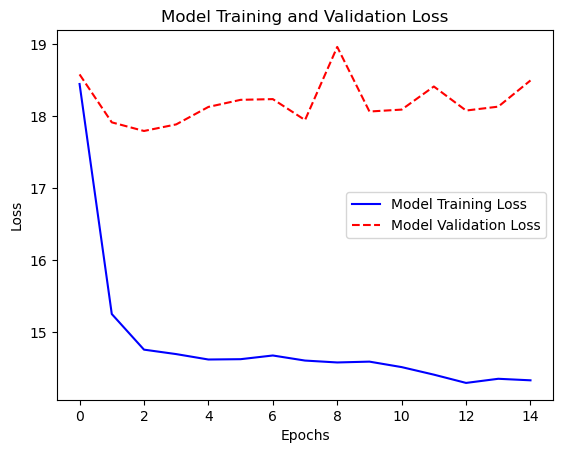

In [16]:
# 학습 결과 시각화
Loss_Visualization(train_losses, val_losses)

In [17]:
sample_image_path = os.path.join(home_dir, 'Timothée_Chalamet.png')
ff = np.fromfile(sample_image_path, np.uint8)
sample_img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
sticker_path = os.path.join(home_dir, 'cat-whiskers.png')
sticker_img = cv2.imread(sticker_path)

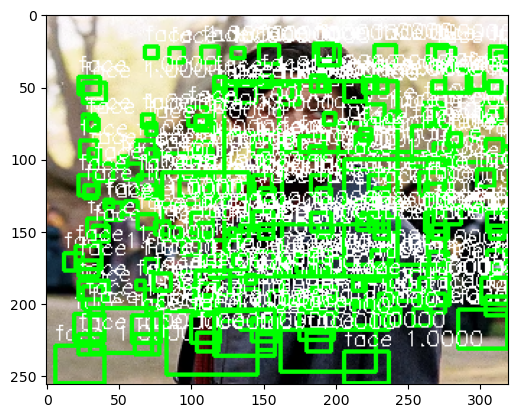

In [45]:
SSDBoundingBox(SSDModel, sample_img, shape=SHAPE, threshold=0.5)

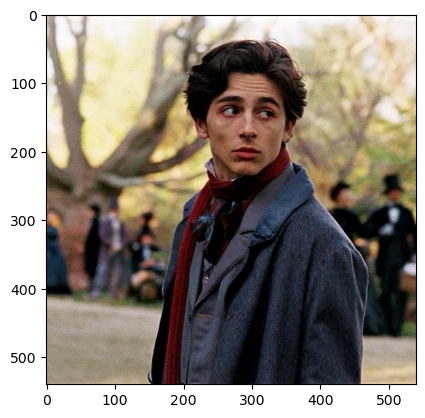

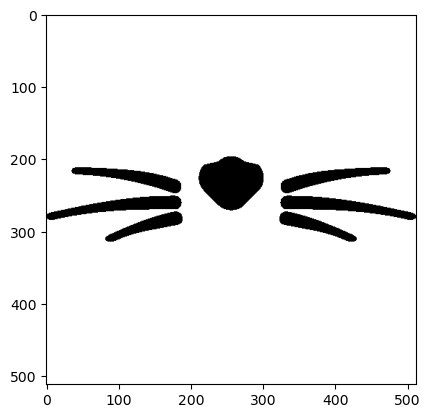

In [19]:
sample_img_rgb = cv2.cvtColor(sample_img.copy(), cv2.COLOR_BGR2RGB)
sticker_img_rgb = cv2.cvtColor(sticker_img.copy(), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img_rgb)
plt.show()
plt.imshow(sticker_img_rgb)
plt.show()

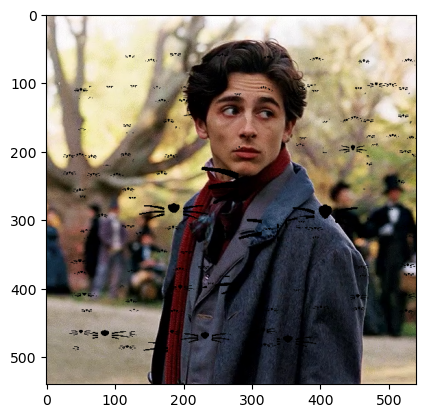

In [54]:
image = CatFilter(model=SSDModel, img=sample_img, sticker=sticker_img, shape=SHAPE)

In [55]:
image_paths = {"cartoon":['Panty_Anarchy.webp','Stocking_Anarchy.webp','Simpsons_Family.png','Homer_Simpson.png','rick_and_morty.jpg','Hazbin_Hotel.webp'],
              "anime":['Panty_Anarchy_moe.webp', 'Stocking_Anarchy_moe.webp','Reze.webp','Reze2.png','Reze3.png','Faye_Valentine.webp','Faye_Valentine2.png'
                       ,'Oshi_no_Ko_My_Star.webp','Oshi_no_Ko_My_Star2.webp'],
              "manga":['Ruby_Hoshino.webp','Ai_Hoshino.webp','Kimetsu_no_Yaiba.webp'],
              "figure":['Stocking_Anarchy_figure.jpg','Panty_Anarchy_figure.jpg','Asuma_Toki.jpg','Kosaka_Wakamo.png','genshin_impact.jpeg'],
              "game_subculture_3d":['Furina1.png','Furina2.png','Augusta1.png','Augusta2.png','mavuika.webp','genshin_impact2.jpg'],
              "PIXAR":['joy.webp','Riley_Andersen.webp','Miguel_Rivera.webp','Woody.webp','soul.webp','coco_family.webp'],
              "game_3d":['Ninave.png','Echidna.png','Abrelshud.webp','lost_ark.jpg','lost_ark2.jpg','Rainbow_Six_Siege_X.webp'],
              "celebrities_asian":['Chaewon.webp','IVE_Wonyoung.jpg','Karina.jpg','Choi_Min_Soo.webp','Won_Bin.jpg','LE_SSERAFIM.webp','BLACKPINK.webp','BTS.webp'],
              "celebrities_westerner":['Joker.webp','Margot_Elise_Robbie.webp','Emma_Charlotte_Duerre_Watson.png','Timothée_Chalamet.png',
                                       'The_Lord_of_the_Rings.webp','Oppenheimer.jpg','Oppenheimer_Neumann.jpg']}

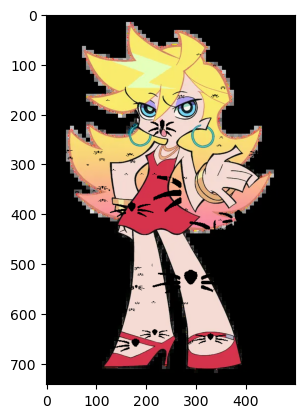

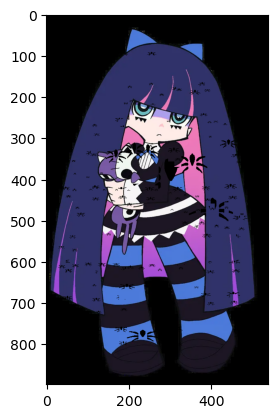

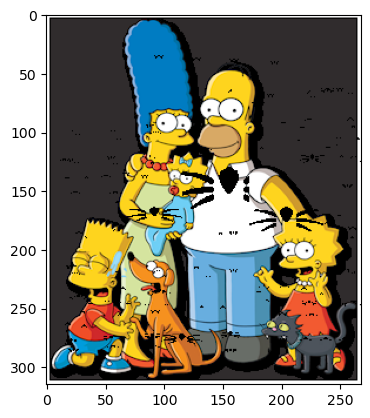

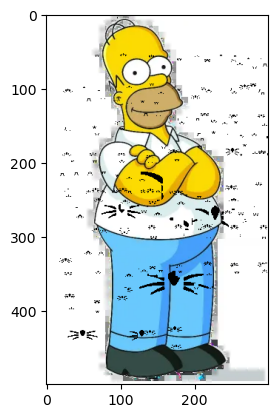

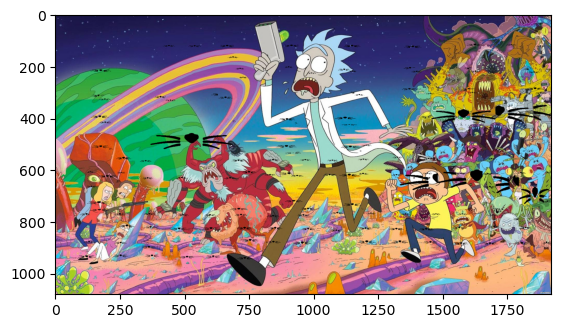

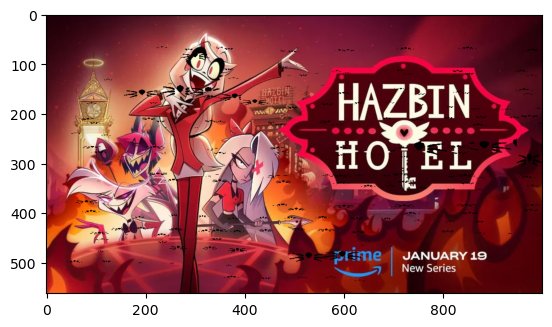

In [56]:
for path in image_paths["cartoon"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

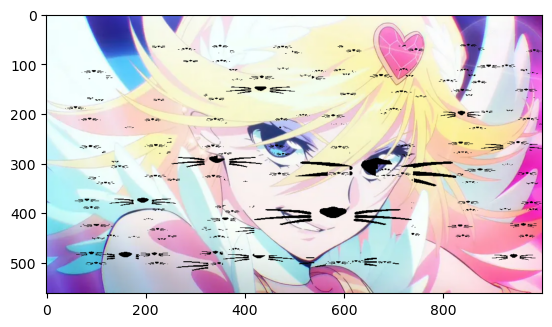

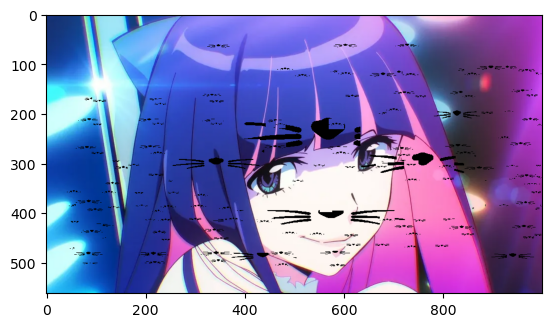

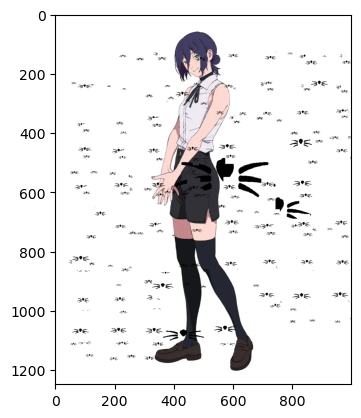

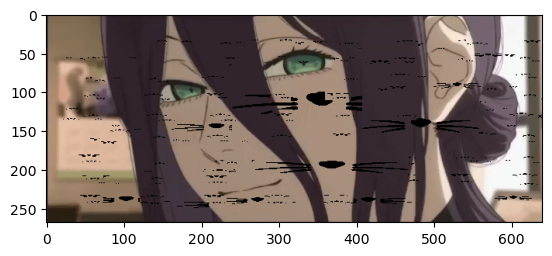

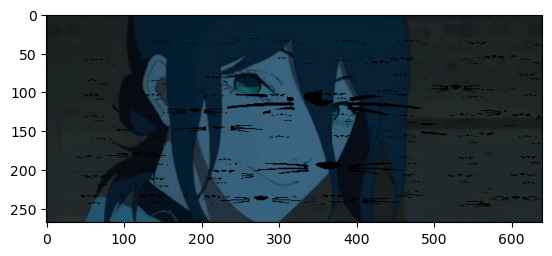

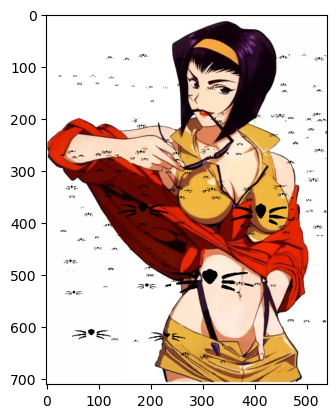

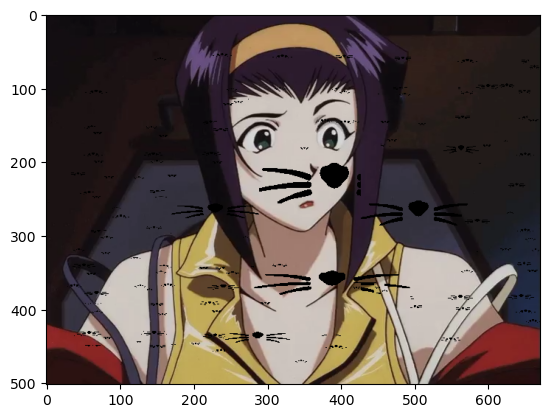

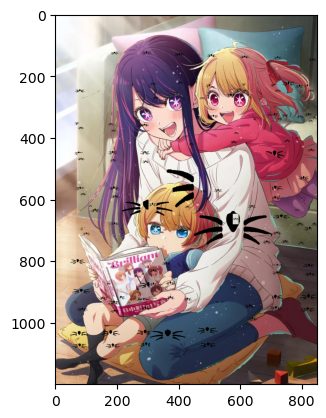

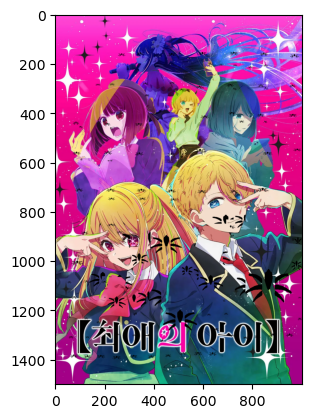

In [57]:
for path in image_paths["anime"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

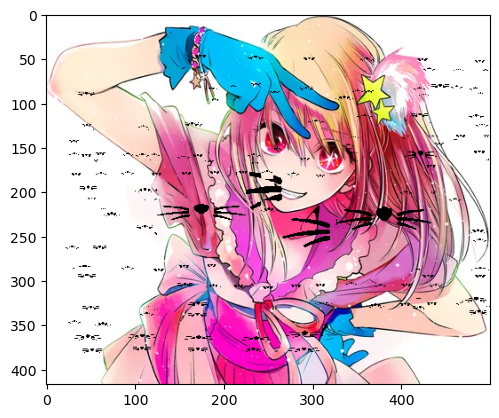

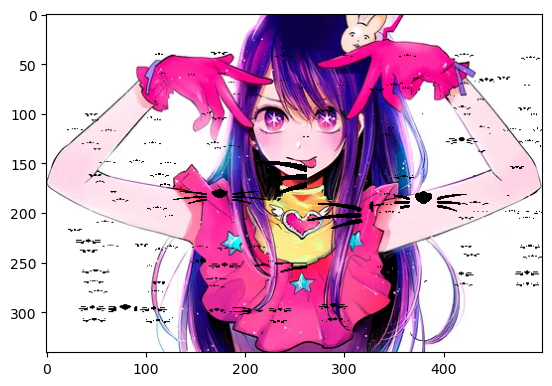

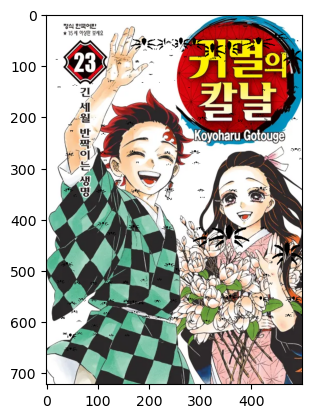

In [58]:
for path in image_paths["manga"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

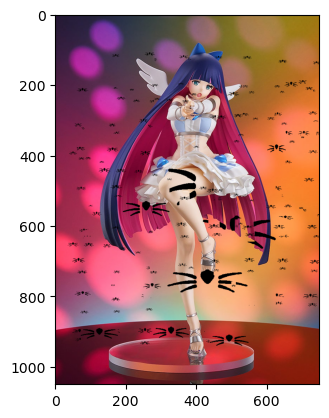

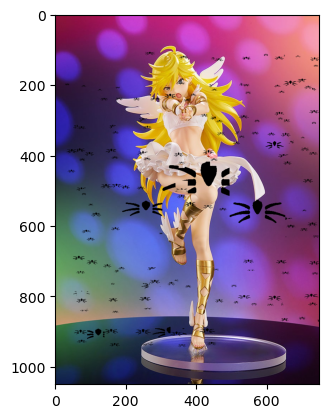

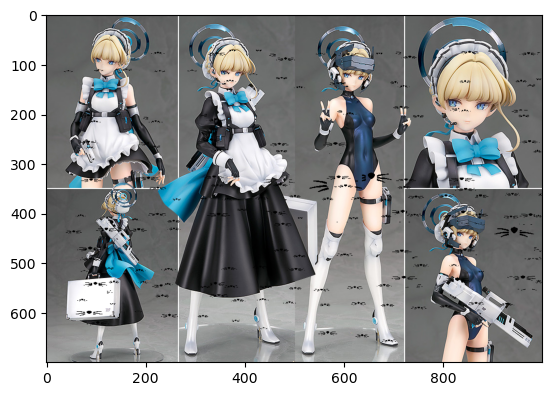

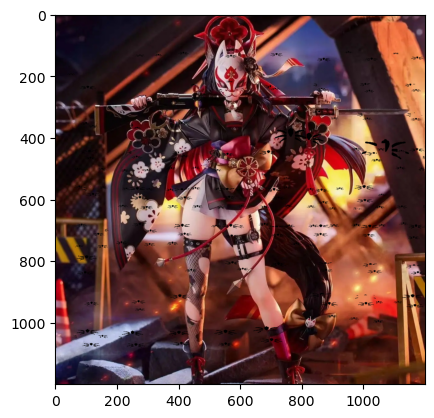

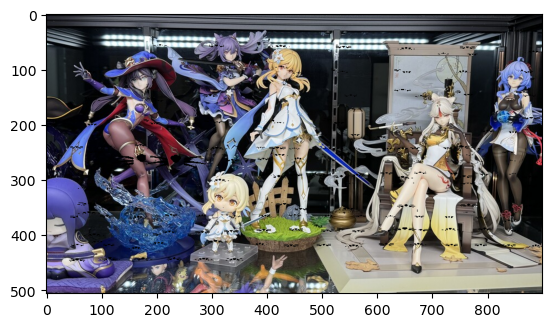

In [59]:
for path in image_paths["figure"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

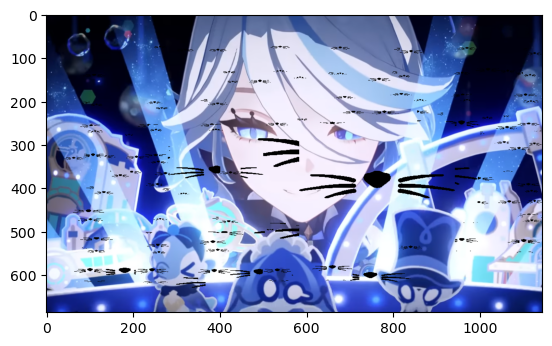

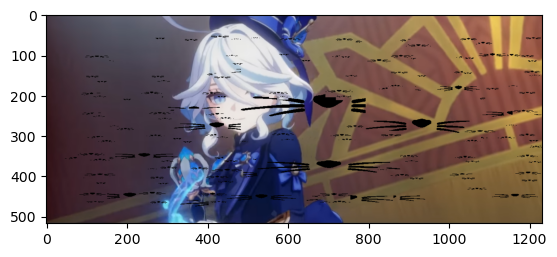

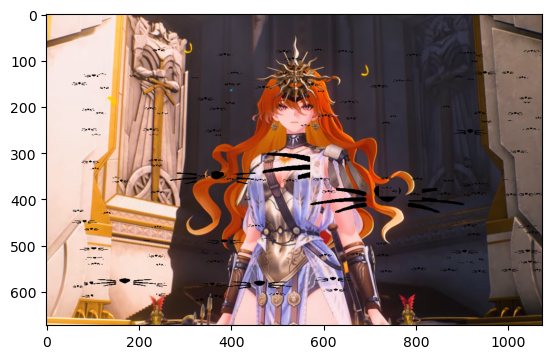

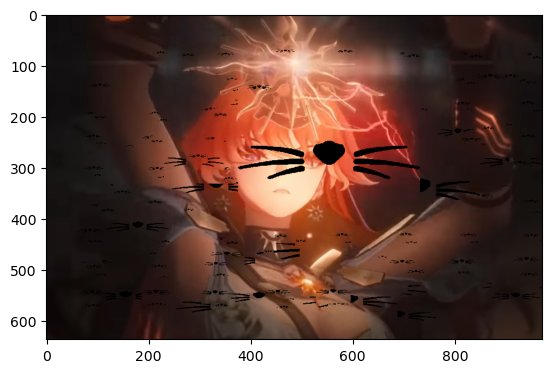

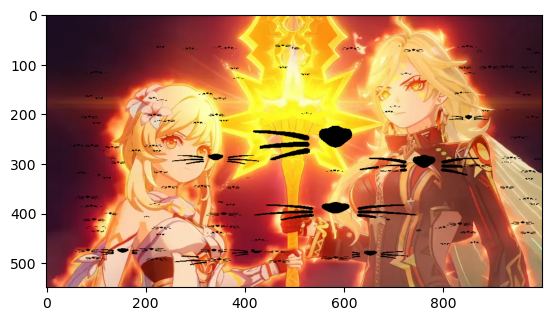

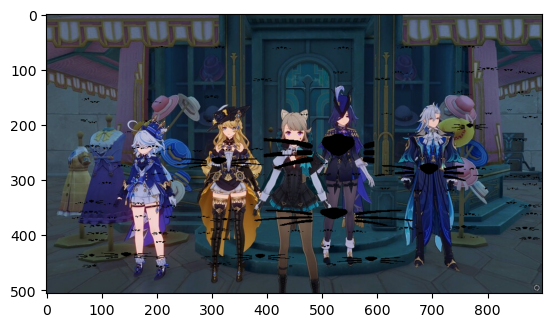

In [60]:
for path in image_paths["game_subculture_3d"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

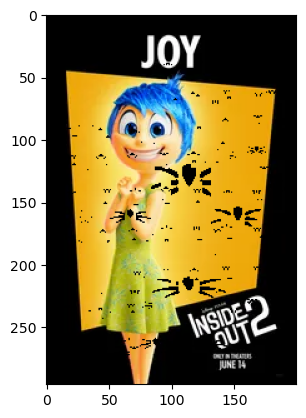

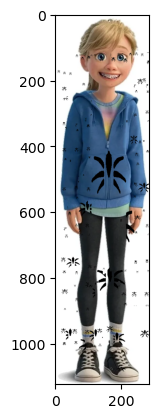

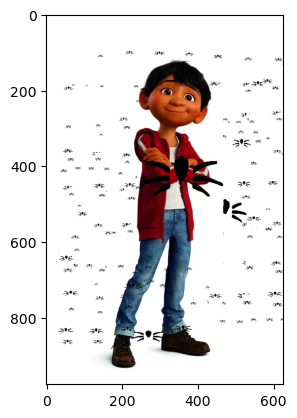

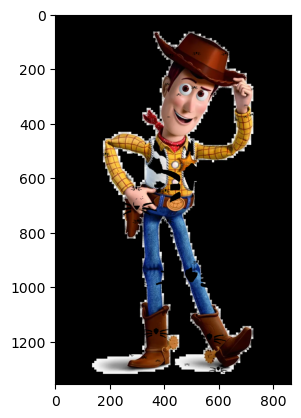

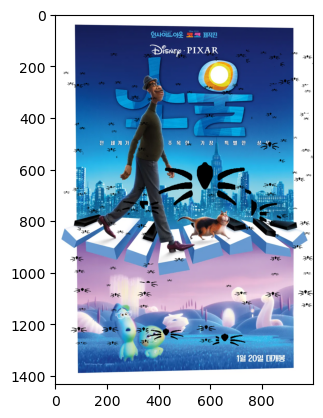

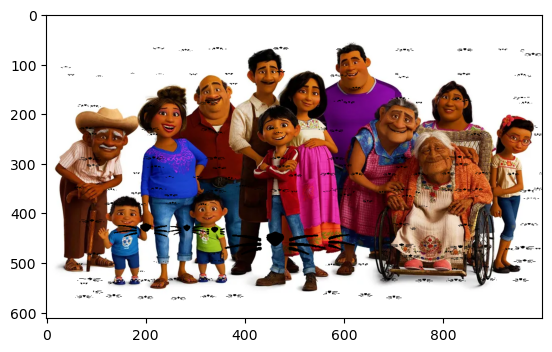

In [61]:
for path in image_paths["PIXAR"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

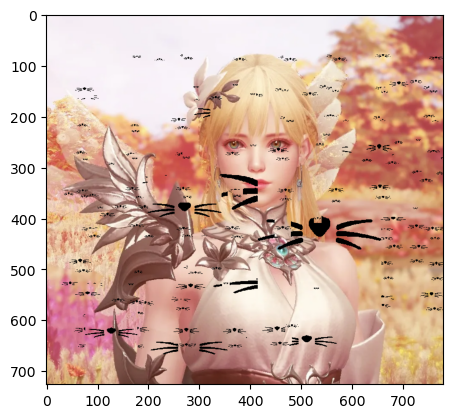

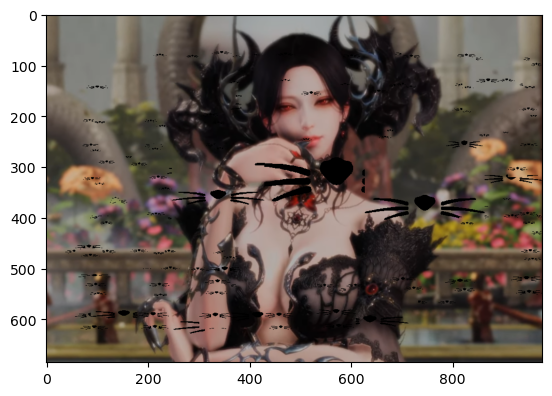

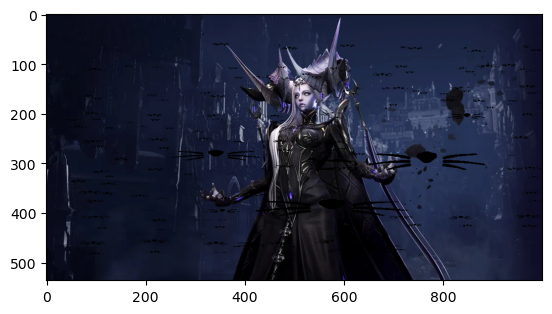

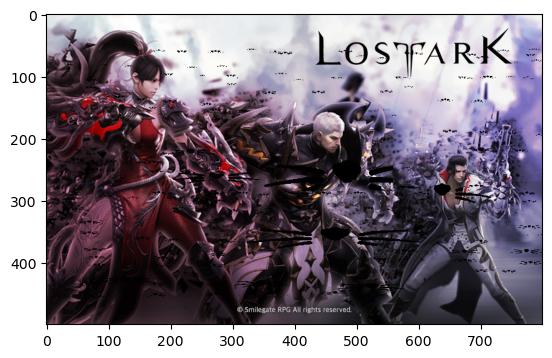

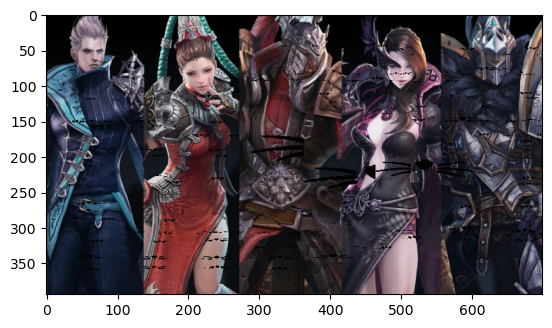

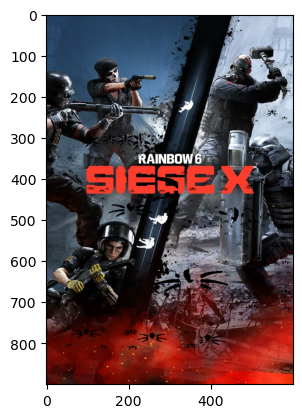

In [62]:
for path in image_paths["game_3d"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

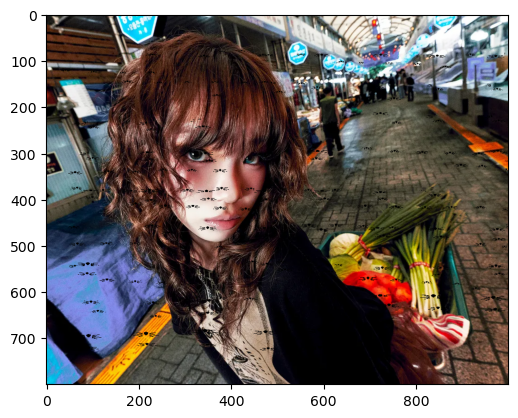

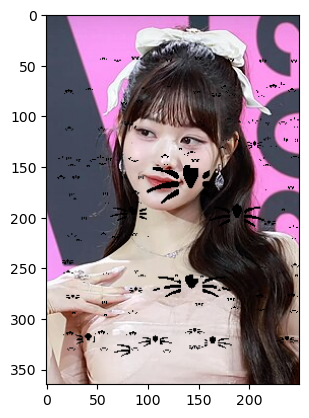

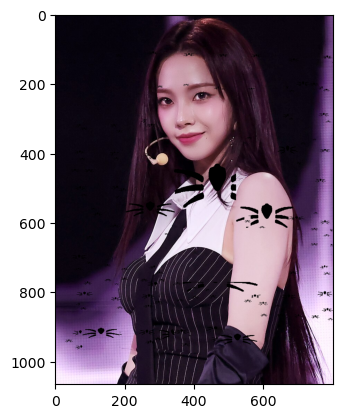

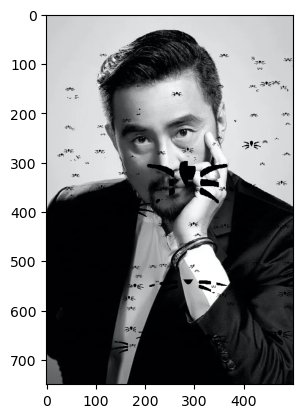

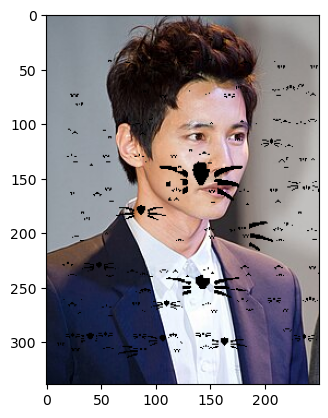

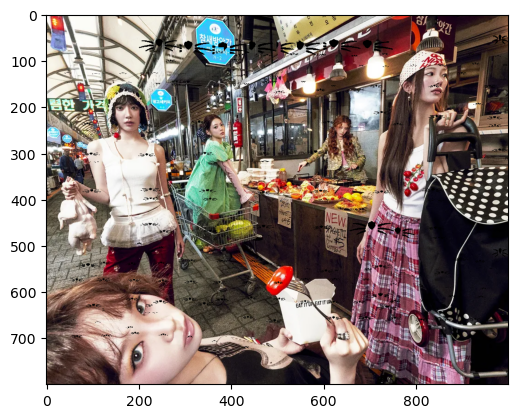

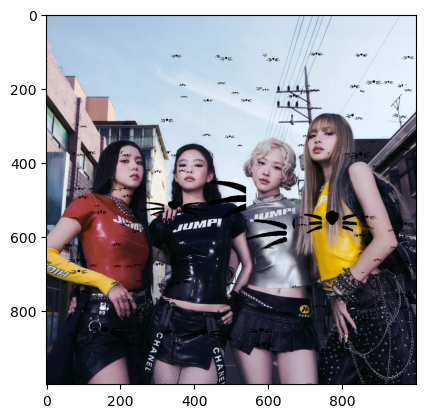

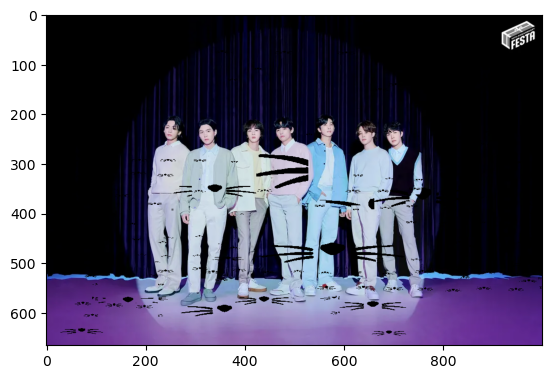

In [63]:
for path in image_paths["celebrities_asian"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

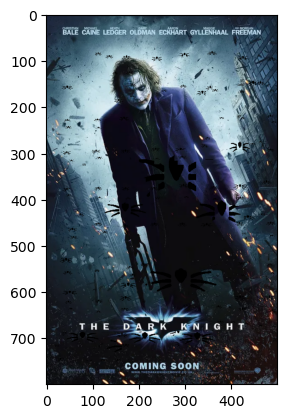

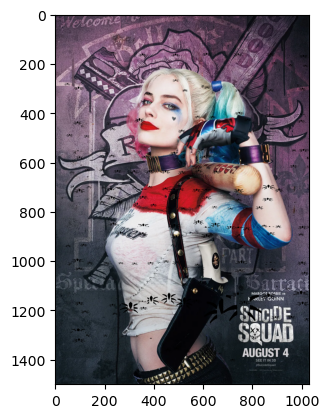

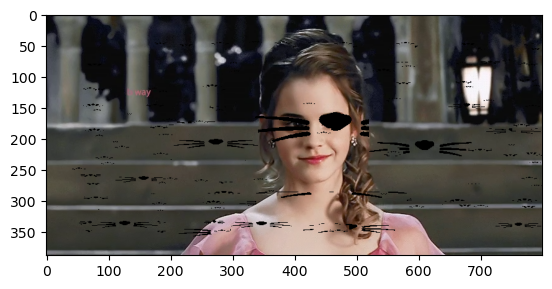

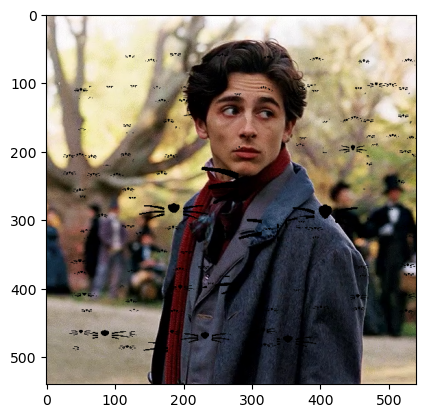

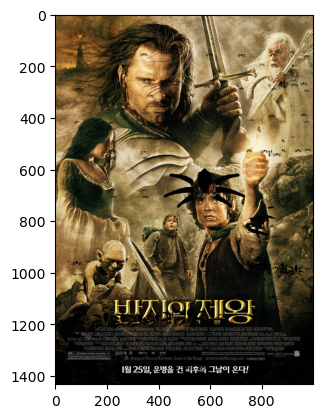

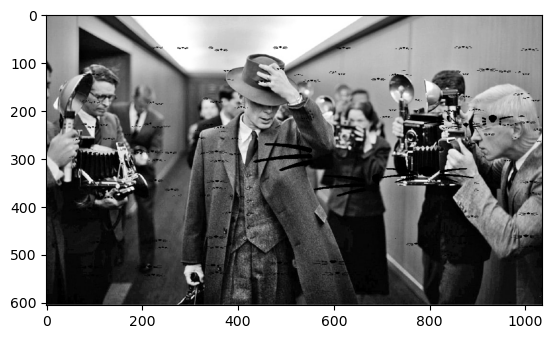

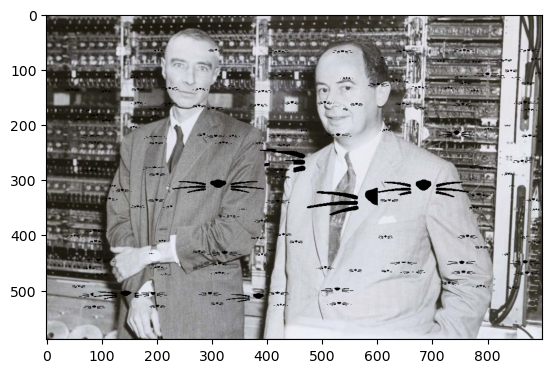

In [64]:
for path in image_paths["celebrities_westerner"]:
    image_path = os.path.join(home_dir, path)
    ff = np.fromfile(image_path, np.uint8)
    img = cv2.imdecode(ff, cv2.IMREAD_UNCHANGED)
    image = CatFilter(model=SSDModel, img=img, sticker=sticker_img, shape=SHAPE)

# 결과

결과적으로 face detection에 실패하였습니다. 이렇게 실패한 이유로 다음과 같은 요소를 예상합니다.

1. 기존의 tfRecode를 사용하여 학습하는 코드에서 dataset을 사용해서 학습하는 코드로 변경하면서 심각한 학습 오류가 발생했을 가능성이 있습니다.
2. 코드 수정으로 인해 시간을 많이 빼앗겨 학습을 적절하게 하지 못했을 가능성이 있습니다.
3. 시간을 단축하기 위하여 너무 높은 learning rate를 사용하여 학습을 잘 하지 못했을 가능성이 있습니다.

1번의 경우 확인 결과 wider_face_train_bbx_gt.txt안에서 내부적으로 정렬되어 있는 순서가 이미지가 정렬되어 있는 순서와 달랐습니다. 하지만, dataset에서는 이 순서가 같다고 가정하고 데이터를 수집하였음으로 큰 오류라고 할 수 있습니다. 현재까지는 이 부분이 가장 큰 요인이라고 예측합니다.

또한, 2번과 3번의 경우 learning rate 를 높이면 초기에 시작하는 loss가 낮아지는 효과가 있었으나 결국에는 비슷한 loss로 수렴하였습니다. 실험을 여러번 하면서 관측한 특이한 사실은 learning rate을 높혀도 train loss 가 약 14, Validation Loss가 약 17 이하로 잘 떨어지지 않는다는 사실입니다. learning rate를 0.01로 설정하였을 때도 validation loss는 17.01 정도에서 포화되었습니다. 이는, 특정 범위에서 local minima에 빠져 learning rate를 낮게 epoch를 높게 설정할 필요가 있음일 수 있습니다.

결과적으로 이번 과제는 실패로 돌아갔으며 가장 큰 요인이였던 dataset을 고치면 큰 개선 사항이 있을 것이라 예상합니다.